THÀNH VIÊN TRONG NHÓM
- Trần Hữu Quang Trường (52100941)
- Hường Quang Huy (52100893)
- Ngô Lê Hoàng (52100890)

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
dry_bean = pd.read_csv("Dry_Bean_Dataset.csv")
dry_bean.head()


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [3]:
#Hiển thị thông tin cơ bản về DataFrame
print(dry_bean.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [4]:
# Tính toán các thống kê mô tả
desc_stats = dry_bean.describe()
print(desc_stats)

                Area     Perimeter  MajorAxisLength  MinorAxisLength  \
count   13611.000000  13611.000000     13611.000000     13611.000000   
mean    53048.284549    855.283459       320.141867       202.270714   
std     29324.095717    214.289696        85.694186        44.970091   
min     20420.000000    524.736000       183.601165       122.512653   
25%     36328.000000    703.523500       253.303633       175.848170   
50%     44652.000000    794.941000       296.883367       192.431733   
75%     61332.000000    977.213000       376.495012       217.031741   
max    254616.000000   1985.370000       738.860153       460.198497   

       AspectRation  Eccentricity     ConvexArea  EquivDiameter        Extent  \
count  13611.000000  13611.000000   13611.000000   13611.000000  13611.000000   
mean       1.583242      0.750895   53768.200206     253.064220      0.749733   
std        0.246678      0.092002   29774.915817      59.177120      0.049086   
min        1.024868      0.

XỬ LÍ DỮ LIỆU

In [5]:
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
data = dry_bean
# Sử dụng LabelEncoder để chuyển cột 'Class' thành dạng số
le = LabelEncoder()
data['Class'] = le.fit_transform(data['Class'])

normalized_data = data.drop('Class', axis=1).copy()

# Sử dụng Min-Max Scaling
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(normalized_data)

# Tạo DataFrame mới với dữ liệu đã chuẩn hóa
normalized_df = pd.DataFrame(normalized_data, columns=data.columns[:-1])  # Loại bỏ cột 'Class'

# Thêm cột 'Class' vào DataFrame đã chuẩn hóa
normalized_df['Class'] = data['Class']

normalized_df.head()
#data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,0.034053,0.058574,0.044262,0.152142,0.122612,0.477797,0.033107,0.070804,0.671024,0.922824,0.934823,0.786733,0.593432,0.833049,0.750996,0.980620,5
1,0.035500,0.077557,0.030479,0.178337,0.051577,0.278472,0.034991,0.073577,0.735504,0.871514,0.793138,0.903549,0.547447,0.967315,0.884987,0.974979,5
2,0.038259,0.068035,0.052633,0.158190,0.131521,0.496448,0.037126,0.078816,0.716671,0.932141,0.914511,0.773514,0.582016,0.800942,0.736200,0.987196,5
3,0.040940,0.082942,0.048548,0.177691,0.091623,0.403864,0.041389,0.083854,0.731365,0.761614,0.826871,0.829912,0.552408,0.854744,0.799846,0.893675,5
4,0.041504,0.065313,0.032862,0.200679,0.025565,0.165680,0.040123,0.084906,0.700538,0.949832,0.988408,0.951583,0.510741,1.000000,0.941770,0.989116,5


CHIA DỮ LIỆU THÀNH TẬP TRAIN VÀ TEST

In [11]:
from sklearn.model_selection import train_test_split

# Assuming normalized_df is already defined and contains the normalized features with the 'Class' column

# Separating features and target variable
X = normalized_df.drop('Class', axis=1)
y = normalized_df['Class']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# You can then print the shapes of these datasets to confirm their sizes
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (10208, 16)
X_test shape: (3403, 16)
y_train shape: (10208,)
y_test shape: (3403,)


VẼ BIỂU ĐỒ CỦA DỮ LIỆU KHI ĐÃ CHUẨN HÓA VÀ CHƯA CHUẨN HÓA

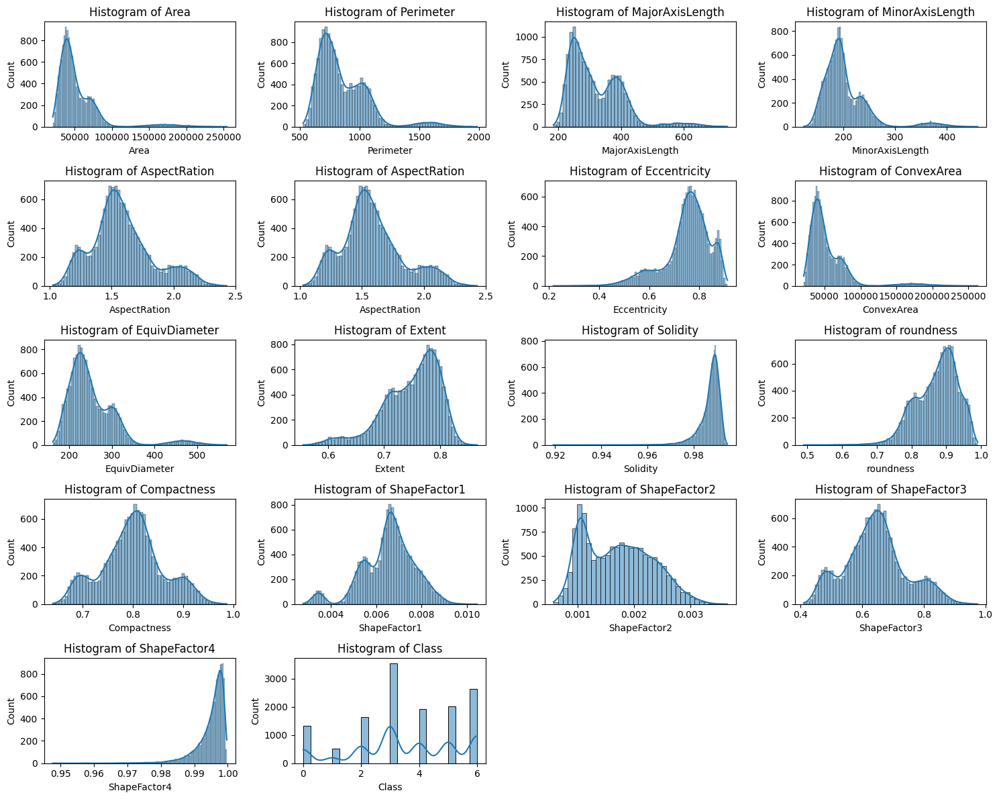

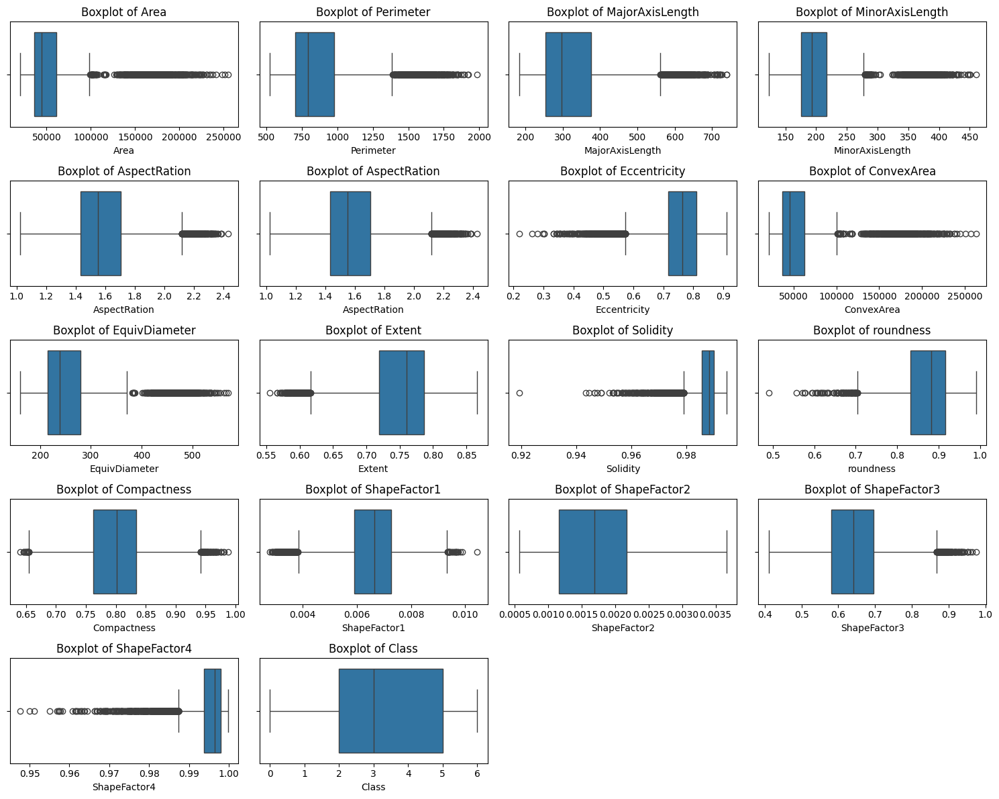

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

features_to_plot = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation',"AspectRation","Eccentricity","ConvexArea","EquivDiameter","Extent","Solidity","roundness","Compactness","ShapeFactor1","ShapeFactor2","ShapeFactor3","ShapeFactor4","Class"]


# Histograms chưa chuẩn hóa
plt.figure(figsize=(15, 12))
for i, feature in enumerate(features_to_plot, 1):
    plt.subplot(5, 4, i)
    sns.histplot(data[feature], kde=True)
    plt.title(f'Histogram of {feature}')
plt.tight_layout()
plt.show()



# Boxplots 
plt.figure(figsize=(15, 12))
for i, feature in enumerate(features_to_plot, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(x=data[feature])
    plt.title(f'Boxplot of {feature}')
plt.tight_layout()
plt.show()



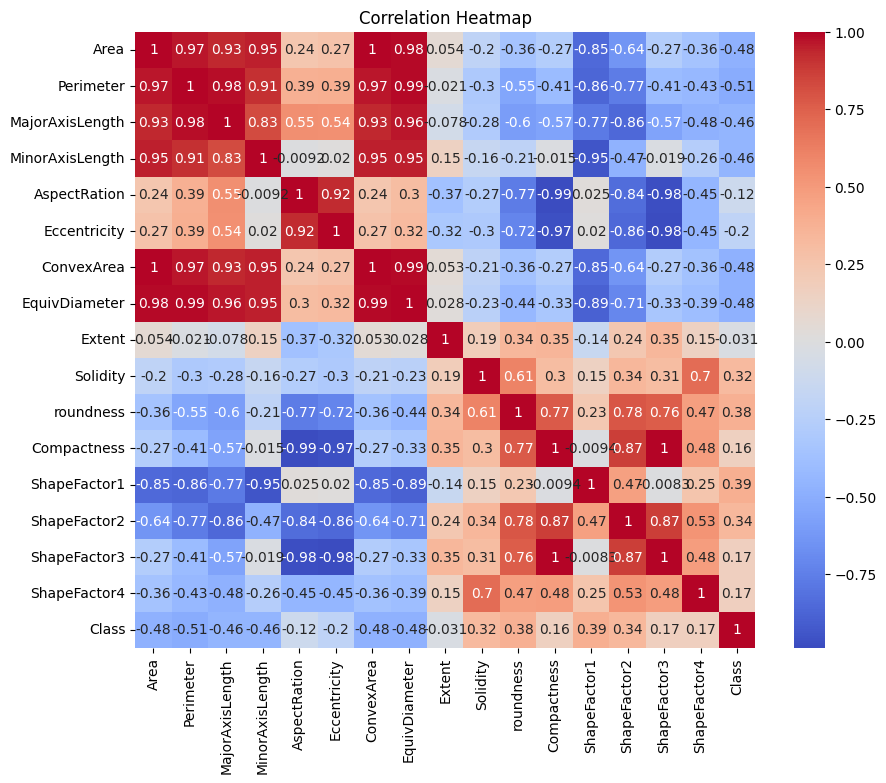

In [41]:
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

<Figure size 1500x1500 with 0 Axes>

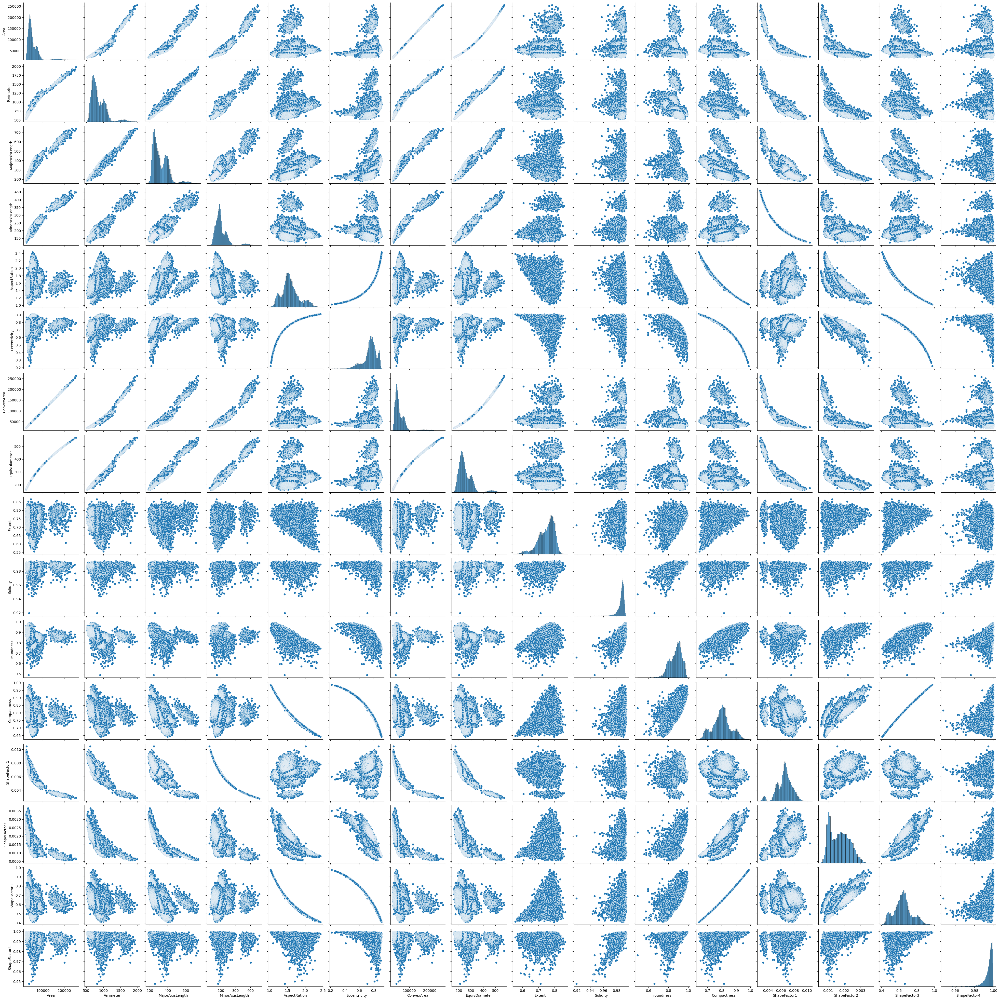

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Danh sách tất cả các đặc trưng bạn muốn vẽ pair plot
all_features = ['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'AspectRation',
                "Eccentricity", "ConvexArea", "EquivDiameter", "Extent", "Solidity",
                "roundness", "Compactness", "ShapeFactor1", "ShapeFactor2",
                "ShapeFactor3", "ShapeFactor4"]

# Số hàng và cột của lưới pair plot
n_rows = 4
n_cols = 4

# Tính số lượng pair plots cần vẽ
total_plots = len(all_features)
num_subplots = n_rows * n_cols

# Tạo các lưới pair plot
for i in range(0, total_plots, num_subplots):
    subset_features = all_features[i:i+num_subplots]
    subset_data = data[subset_features]
    
    plt.figure(figsize=(15, 15))
    sns.pairplot(subset_data)
    plt.show()


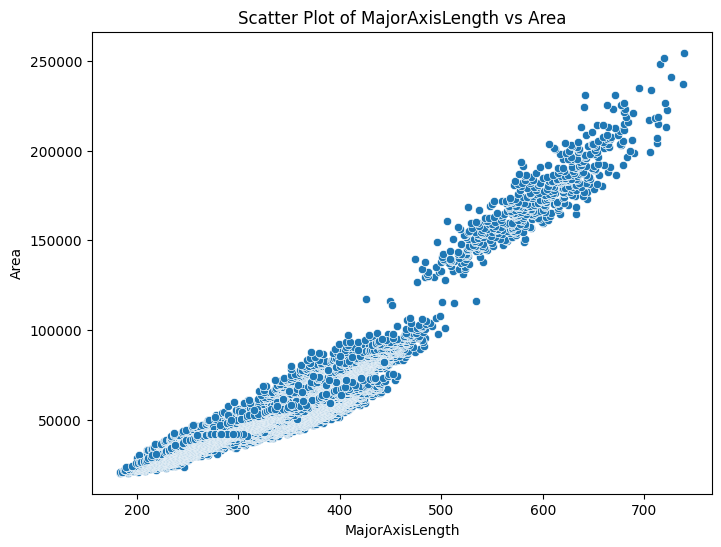

In [23]:
# Ví dụ: Mối quan hệ giữa MajorAxisLength và Area
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data['MajorAxisLength'], y=data['Area'])
plt.title('Scatter Plot of MajorAxisLength vs Area')
plt.show()


ĐÁNH GIÁ VAI TRÒ CỦA CÁC ĐẶC TRƯNG

In [44]:

data['Class']=le.fit_transform(data['Class'])
corr_matrix = data.corr()


# các column 
corr_features = corr_matrix.index

# Sắp xếp các đặc trưng theo thứ tự giảm dần 
sorted_features = corr_matrix.abs().sort_values(by = 'Class',ascending=False)[1:10]
print(sorted_features)

                     Area  Perimeter  MajorAxisLength  MinorAxisLength  \
Perimeter        0.966722   1.000000         0.977338         0.913179   
EquivDiameter    0.984968   0.991380         0.961733         0.948539   
ConvexArea       0.999939   0.967689         0.932607         0.951339   
Area             1.000000   0.966722         0.931834         0.951602   
MinorAxisLength  0.951602   0.913179         0.826052         1.000000   
MajorAxisLength  0.931834   0.977338         1.000000         0.826052   
ShapeFactor1     0.847958   0.864623         0.773609         0.947204   
roundness        0.357530   0.547647         0.596358         0.210344   
ShapeFactor2     0.639291   0.767592         0.859238         0.471347   

                 AspectRation  Eccentricity  ConvexArea  EquivDiameter  \
Perimeter            0.385276      0.391066    0.967689       0.991380   
EquivDiameter        0.303647      0.318667    0.985226       1.000000   
ConvexArea           0.243301      0.

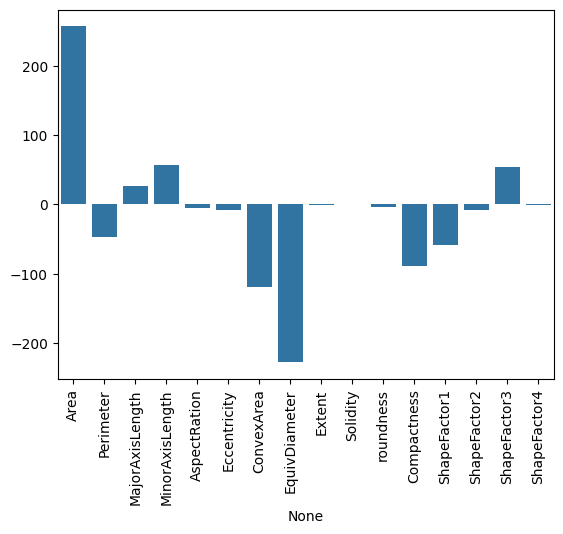

In [46]:
from sklearn.linear_model import LinearRegression

# Train a linear regression model
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)

# Get coefficients
coefficients = linear_reg.coef_

# Plotting the coefficients
sns.barplot(x=X_train.columns, y=coefficients)
plt.xticks(rotation=90)
plt.show()


In [47]:
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X_train)

# Fit the model
model = LinearRegression()
model.fit(X_poly, y_train)

# You would then look at the model coefficients to understand the interactions


LinearRegression()

ỨNG DỤNG CÁC MÔ HÌNH HỌC MÁY CƠ BẢN ĐỂ GIẢI QUYẾT BÀI TOÁN

In [101]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Logistic Regression
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)
y_pred_lr_head = lr_model.predict(X_test[:5])
y_pred_lr = lr_model.predict(X_test)
print("Logistic Regression Accuracy Before:", accuracy_score(y_test[:5], y_pred_lr_head))
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_lr))



Logistic Regression Accuracy Before: 1.0
Logistic Regression Accuracy: 0.9179725759059746
              precision    recall  f1-score   support

           0       0.94      0.88      0.91       395
           1       1.00      1.00      1.00       161
           2       0.92      0.94      0.93       479
           3       0.92      0.90      0.91      1043
           4       0.97      0.95      0.96       588
           5       0.94      0.94      0.94       619
           6       0.83      0.89      0.86       799

    accuracy                           0.92      4084
   macro avg       0.93      0.93      0.93      4084
weighted avg       0.92      0.92      0.92      4084



In [102]:

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

# K-Nearest Neighbors
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
y_pred_knn = knn_model.predict(X_test)
y_pred_knn_head = knn_model.predict(X_test[:5])
print("KNN Accuracy Before:", accuracy_score(y_test[:5], y_pred_knn_head))
print("KNN Accuracy:", accuracy_score(y_test, y_pred_knn))
print(classification_report(y_test, y_pred_knn))

KNN Accuracy Before: 1.0
KNN Accuracy: 0.9199314397649363
              precision    recall  f1-score   support

           0       0.95      0.89      0.92       395
           1       1.00      1.00      1.00       161
           2       0.91      0.94      0.93       479
           3       0.90      0.92      0.91      1043
           4       0.96      0.95      0.95       588
           5       0.95      0.95      0.95       619
           6       0.86      0.87      0.87       799

    accuracy                           0.92      4084
   macro avg       0.93      0.93      0.93      4084
weighted avg       0.92      0.92      0.92      4084



In [97]:

from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import classification_report, accuracy_score

# Decision Tree
tree_model = DecisionTreeClassifier()
tree_model.fit(X_train, y_train)
y_pred_tree = tree_model.predict(X_test)
print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_tree))
print(classification_report(y_test, y_pred_tree))


Decision Tree Accuracy: 0.8873653281096964
              precision    recall  f1-score   support

           0       0.88      0.90      0.89       395
           1       1.00      1.00      1.00       161
           2       0.91      0.90      0.91       479
           3       0.87      0.88      0.88      1043
           4       0.94      0.93      0.93       588
           5       0.91      0.90      0.91       619
           6       0.82      0.82      0.82       799

    accuracy                           0.89      4084
   macro avg       0.90      0.90      0.90      4084
weighted avg       0.89      0.89      0.89      4084



In [98]:
# Random Forest

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import classification_report, accuracy_score
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))



Random Forest Accuracy: 0.9214005876591577
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       395
           1       1.00      1.00      1.00       161
           2       0.93      0.93      0.93       479
           3       0.90      0.92      0.91      1043
           4       0.96      0.95      0.96       588
           5       0.95      0.94      0.94       619
           6       0.87      0.87      0.87       799

    accuracy                           0.92      4084
   macro avg       0.93      0.93      0.93      4084
weighted avg       0.92      0.92      0.92      4084



In [99]:

from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
# Support Vector Machine
svm_model = SVC()
svm_model.fit(X_train, y_train)
y_pred_svm = svm_model.predict(X_test)
print("SVM Accuracy:", accuracy_score(y_test, y_pred_svm))
print(classification_report(y_test, y_pred_svm))

SVM Accuracy: 0.9275220372184133
              precision    recall  f1-score   support

           0       0.95      0.90      0.92       395
           1       1.00      1.00      1.00       161
           2       0.93      0.95      0.94       479
           3       0.92      0.92      0.92      1043
           4       0.97      0.96      0.96       588
           5       0.96      0.94      0.95       619
           6       0.86      0.90      0.88       799

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



TRÁNH OVERFITTING CHO CÁC MÔ HÌNH HỌC MÁY CƠ BẢN

Logistic Regression Accuracy before: 0.9179725759059746
Logistic Regression Accuracy after regularization: 0.9145445641527914


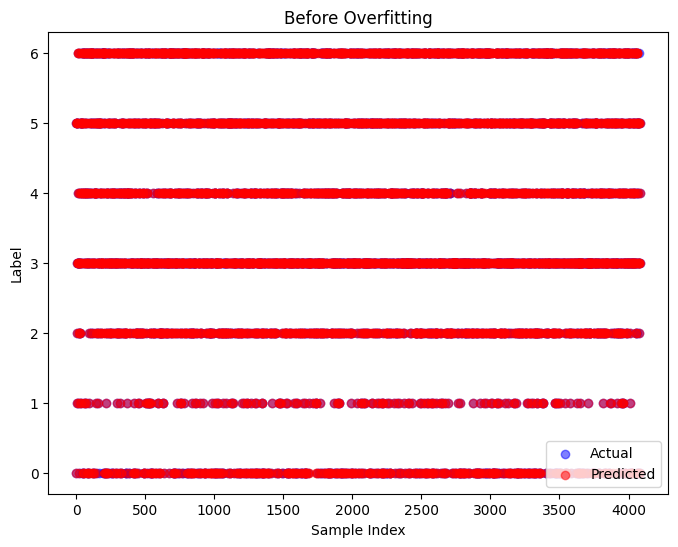

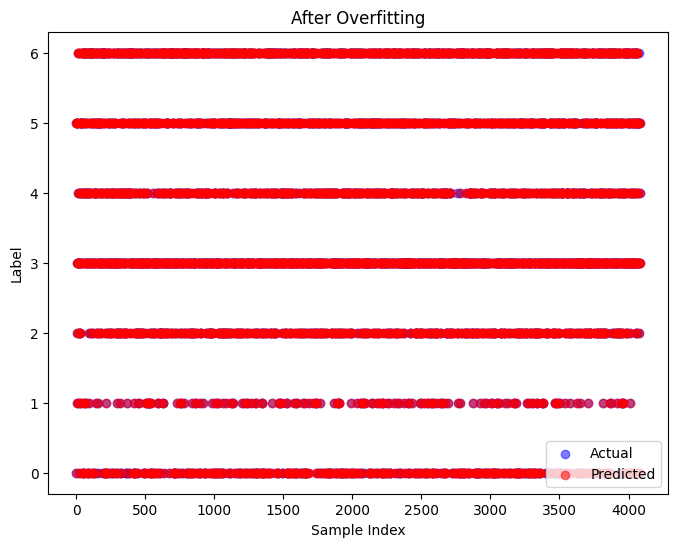

In [111]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score


lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)

y_pred_lr = lr_model.predict(X_test)
print("Logistic Regression Accuracy before:", accuracy_score(y_test, y_pred_lr))

# Logistic Regression overfitting
lr_model_ovt = LogisticRegression(max_iter=7000, C=10, penalty='l2', solver='liblinear')
lr_model_ovt.fit(X_train, y_train)
y_pred_lr_ovt = lr_model_ovt.predict(X_test)
print("Logistic Regression Accuracy after regularization:", accuracy_score(y_test, y_pred_lr_ovt))
#
# Scatter plot

plt.figure(figsize=(8, 6))
plt.scatter(range(len(y_test)), y_test, color='blue', alpha=0.5, label='Actual')
plt.scatter(range(len(y_pred_lr)), y_pred_lr, color='red', alpha=0.5, label='Predicted')
plt.title("Before Overfitting")
plt.xlabel("Sample Index")
plt.ylabel("Label")
plt.legend()
plt.show()
# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(len(y_test)), y_test, color='blue', alpha=0.5, label='Actual')
plt.scatter(range(len(y_pred_lr_ovt)), y_pred_lr_ovt, color='red', alpha=0.5, label='Predicted')
plt.title("After Overfitting")
plt.xlabel("Sample Index")
plt.ylabel("Label")
plt.legend()
plt.show()

KNN Accuracy before: 0.9199314397649363
KNN Accuracy after: 0.9196865817825661


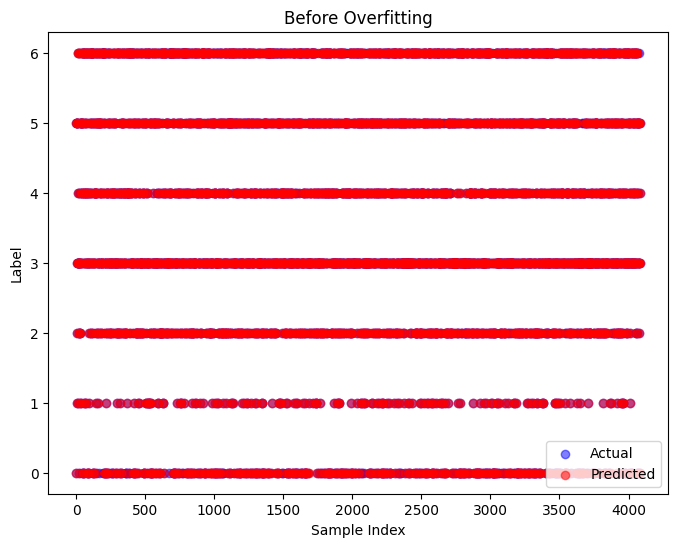

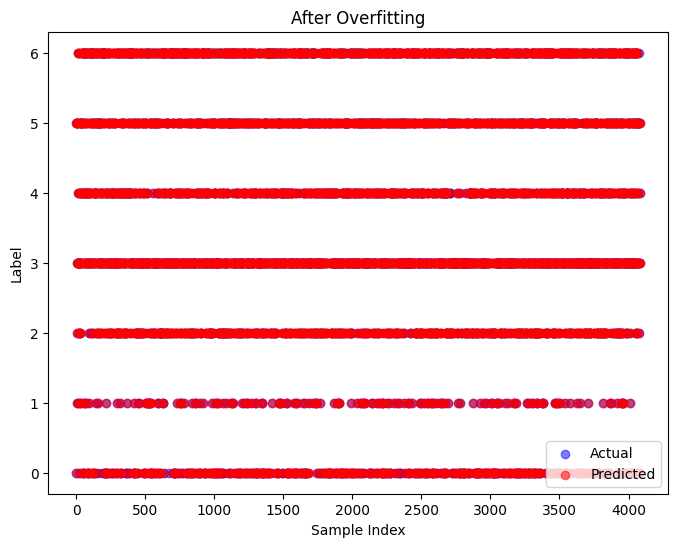

In [112]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

# K-Nearest Neighbors
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
y_pred_knn = knn_model.predict(X_test)
print("KNN Accuracy before:", accuracy_score(y_test, y_pred_knn))

# K-Nearest Neighbors after overfitting
knn_model_ovt = KNeighborsClassifier(n_neighbors=10)
knn_model_ovt.fit(X_train, y_train)
y_pred_knn_ovt = knn_model_ovt.predict(X_test)
print("KNN Accuracy after:", accuracy_score(y_test, y_pred_knn_ovt))

# Scatter plot

plt.figure(figsize=(8, 6))
plt.scatter(range(len(y_test)), y_test, color='blue', alpha=0.5, label='Actual')
plt.scatter(range(len(y_pred_knn)), y_pred_knn, color='red', alpha=0.5, label='Predicted')
plt.title("Before Overfitting")
plt.xlabel("Sample Index")
plt.ylabel("Label")
plt.legend()
plt.show()
# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(len(y_test)), y_test, color='blue', alpha=0.5, label='Actual')
plt.scatter(range(len(y_pred_knn_ovt)), y_pred_knn_ovt, color='red', alpha=0.5, label='Predicted')
plt.title("After Overfitting")
plt.xlabel("Sample Index")
plt.ylabel("Label")
plt.legend()
plt.show()

Decision Tree accuracy score before: 0.888099902056807
Decision Tree accuracy score after: 0.8797747306562194


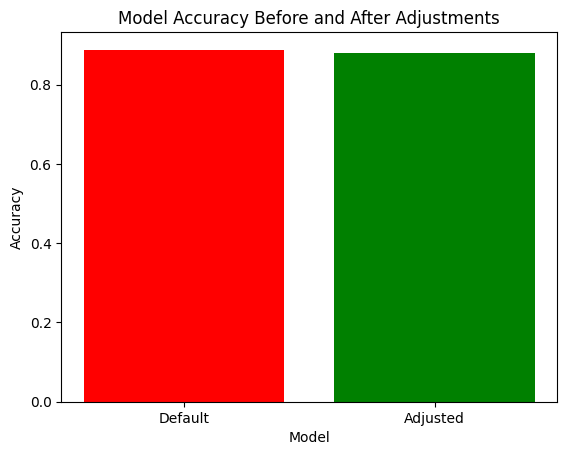

In [114]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import matplotlib.pyplot as plt

# Giả sử bạn đã có DataFrame data
le = LabelEncoder()
data['Class'] = le.fit_transform(data['Class'])

# Áp dụng MinMaxScaler
scaler = MinMaxScaler()
features = data.drop('Class', axis=1)
scaled_features = scaler.fit_transform(features)

# Chia dữ liệu
X_train, X_test, y_train, y_test = train_test_split(scaled_features, data['Class'], test_size=0.3, random_state=42)

# Huấn luyện mô hình với các tham số mặc định
clf_default = DecisionTreeClassifier(random_state=42)
clf_default.fit(X_train, y_train)
y_pred_default = clf_default.predict(X_test)
accuracy_default = accuracy_score(y_test, y_pred_default)

# Huấn luyện mô hình với các tham số giảm overfitting
clf_adjusted = DecisionTreeClassifier(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42)
clf_adjusted.fit(X_train, y_train)
y_pred_adjusted = clf_adjusted.predict(X_test)
accuracy_adjusted = accuracy_score(y_test, y_pred_adjusted)
print("Decision Tree accuracy score before:",accuracy_default)
print("Decision Tree accuracy score after:",accuracy_adjusted)
# Vẽ biểu đồ độ chính xác
plt.bar(['Default', 'Adjusted'], [accuracy_default, accuracy_adjusted], color=['red', 'green'])
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Before and After Adjustments')
plt.show()


ỨNG DỤNG CÁC MÔ HÌNH THUỘC ENSEMBLE LEARNING ĐỂ GIẢI QUYẾT BÀI TOÁN

In [115]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score

# Random Forest Classifier
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)

# Gradient Boosting Classifier
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
accuracy_gb = accuracy_score(y_test, y_pred_gb)

# AdaBoost Classifier
ab_model = AdaBoostClassifier()
ab_model.fit(X_train, y_train)
y_pred_ab = ab_model.predict(X_test)
accuracy_ab = accuracy_score(y_test, y_pred_ab)

# In ra độ chính xác
print("Random Forest Accuracy:", accuracy_rf)
print("Gradient Boosting Accuracy:", accuracy_gb)
print("AdaBoost Accuracy:", accuracy_ab)


Random Forest Accuracy: 0.9223800195886386
Gradient Boosting Accuracy: 0.9267874632713027
AdaBoost Accuracy: 0.6466699314397649


Feed Forward Neural Network 

FFNN Accuracy: 0.921645445641528
MSE: 0.5976983349657199


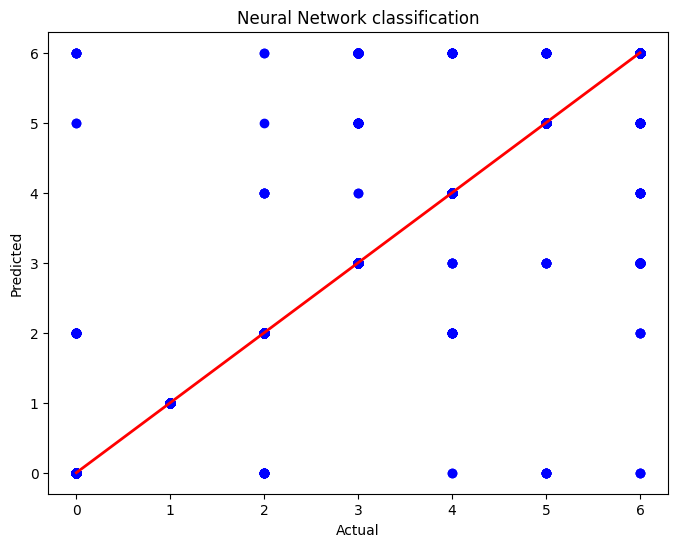

In [121]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error

# Tạo mô hình FFNN
ffnn_model = MLPClassifier(hidden_layer_sizes=(100, 100), max_iter=500)
ffnn_model.fit(X_train, y_train)

# Dự đoán và đánh giá mô hình
y_pred_ffnn = ffnn_model.predict(X_test)
accuracy_ffnn = accuracy_score(y_test, y_pred_ffnn)
mse_ffnn = mean_squared_error(y_test,y_pred_ffnn)
print("FFNN Accuracy:", accuracy_ffnn)
print("MSE:", mse_ffnn)
#Biểu đồ giữa giá trị dự đoán và giá trị thực tế
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_ffnn, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '-', color='red', linewidth=2)
plt.title('Neural Network classification')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

Giảm overfitting Feed Forward Neural Network 

FFNN Accuracy: 0.915279138099902
MSE: 0.6594025465230167


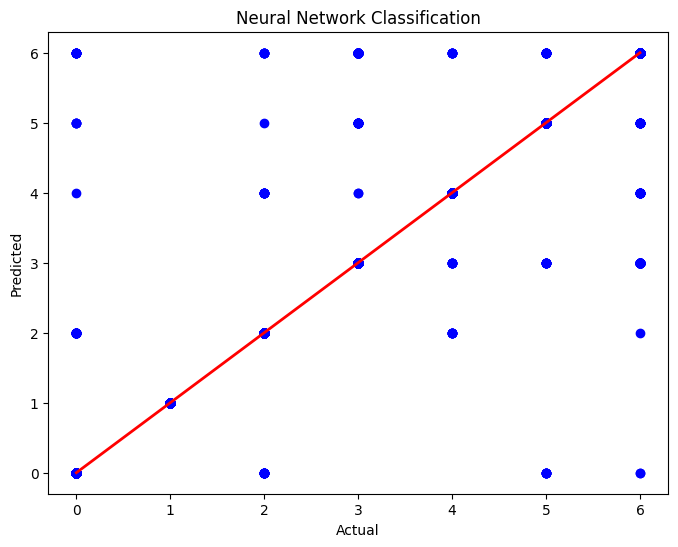

In [123]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, mean_squared_error
import matplotlib.pyplot as plt

# Tạo mô hình FFNN với cấu hình để giảm overfitting
ffnn_model = MLPClassifier(hidden_layer_sizes=(100, 100), max_iter=500,
                           alpha=0.001,  # Thêm hệ số regularization L2
                           early_stopping=True,  # Sử dụng early stopping để tránh overfitting
                           validation_fraction=0.2)  # Phần trăm dữ liệu dùng để validation

ffnn_model.fit(X_train, y_train)

# Dự đoán và đánh giá mô hình
y_pred_ffnn = ffnn_model.predict(X_test)
accuracy_ffnn = accuracy_score(y_test, y_pred_ffnn)
mse_ffnn = mean_squared_error(y_test, y_pred_ffnn)

print("FFNN Accuracy:", accuracy_ffnn)
print("MSE:", mse_ffnn)

# Vẽ biểu đồ giữa giá trị dự đoán và giá trị thực tế
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_ffnn, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '-', color='red', linewidth=2)
plt.title('Neural Network Classification')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()


CẢI THIỆN ĐỘ CHÍNH XÁC
Để cải thiện độ chính xác của các mô hình thì có nhiều cách như làm sạch và chuẩn hóa dữ liệu, tránh overfitting, sử dụng các mô hình thuộc Ensemble Learning, lọc bớt các feature,... 
Ở các câu trên thì ta đã thực hiện việc tránh overfitting, và chuẩn hóa dữ liệu.
Áp dụng việc tránh overfitting cho thấy nó không giúp tăng độ chính xác mà nó còn giảm. Nguyên nhân là do 
- Hiện tượng Overfitting của Mô hình Mặc định: Mô hình mặc định có thể đã overfitting lên nhiễu trong dữ liệu huấn luyện, dẫn đến độ chính xác cao trên bộ test cụ thể nhưng có thể tồi tệ hơn khi tổng quát hóa với dữ liệu mới.
- Hiện tượng Underfitting của Mô hình Đã Điều Chỉnh: Mô hình đã điều chỉnh, với các ràng buộc như max_depth, min_samples_split, và min_samples_leaf, có thể quá đơn giản để nắm bắt được sự phức tạp của dữ liệu, dẫn đến underfitting và độ chính xác thấp hơn.
- Sự Đa dạng trong Bộ Test: Bộ test có thể chứa những mô hình hoặc điểm ngoại lệ nhất định mà mô hình overfitting có thể nắm bắt tốt hơn. Mô hình với tham số đã điều chỉnh, mặc dù phổ quát hơn, có thể không hoạt động tốt trên bộ dữ liệu cụ thể này.

In [8]:
#So sánh độ chính xác giữa việc chuẩn hóa dữ liệu và không chuẩn hóa dữ liệu
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

# Giả sử bạn đã có DataFrame data
le = LabelEncoder()
data['Class'] = le.fit_transform(data['Class'])

# Áp dụng MinMaxScaler
scaler = MinMaxScaler()
features = data.drop('Class', axis=1)
scaled_features = scaler.fit_transform(features)

# Chia dữ liệu đã scaler
X_train, X_test, y_train, y_test = train_test_split(scaled_features, data['Class'], test_size=0.3, random_state=42)


#Không scaler
X_train_non, X_test_non, y_train_non, y_test_non = train_test_split(data.drop('Class', axis=1),data['Class'], test_size=0.3, random_state=42)

# Huấn luyện mô hình với các tham số mặc định
clf_default = DecisionTreeClassifier(random_state=42)
clf_default.fit(X_train, y_train)
y_pred_default = clf_default.predict(X_test)
accuracy_default = accuracy_score(y_test, y_pred_default)


clf_non = DecisionTreeClassifier(random_state=42)
clf_non.fit(X_train_non, y_train_non)
y_pred_non = clf_non.predict(X_test_non)
accuracy_non= accuracy_score(y_test_non, y_pred_non)

print(X_test[:5])
print(X_test_non[:5])

print("Độ chính xác trước khi chuẩn hóa dữ liệu",accuracy_non)

print("Độ chính xác sau khi chuẩn hóa dữ liệu",accuracy_default)



[[0.09359255 0.14821646 0.13795034 0.25110244 0.16384646 0.5565504
  0.09065987 0.17380841 0.69444005 0.96587347 0.95549916 0.72604916
  0.43888138 0.59313957 0.68368457 0.993279  ]
 [0.20421783 0.38614602 0.33636012 0.34159305 0.3786662  0.79072634
  0.20400945 0.32718802 0.68311929 0.70688452 0.46675187 0.44799576
  0.34521195 0.25127714 0.39532366 0.74289604]
 [0.07445046 0.125959   0.11675482 0.21276483 0.18024767 0.58324904
  0.07233992 0.14284806 0.60899757 0.94018145 0.91303346 0.7012726
  0.49321241 0.6143021  0.65665293 0.97121827]
 [0.05432629 0.08465434 0.07010268 0.19907475 0.10526576 0.43832678
  0.05232565 0.10824999 0.69050724 0.97761785 1.         0.81495876
  0.51297197 0.78806118 0.78283928 0.99486328]
 [0.04058566 0.08409636 0.09745518 0.11398818 0.32130363 0.74624173
  0.03972759 0.08319099 0.73981839 0.89741989 0.812526   0.52076668
  0.67321022 0.53650545 0.4676104  0.91908284]]
        Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
1488   4233

Ta thấy việc chuẩn hóa đối với tập dữ liệu này nó không mang lại nhiều tác dụng vì nó không tăng độ chính xác của mô hình

In [16]:
#Lọc các feater không quan trọng
import pandas as pd
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif




# Tách feature và biến mục tiêu
X_corr = data.drop('Class', axis=1)
y_corr = data['Class']

# Sử dụng phương pháp ANOVA F-test để lựa chọn K features quan trọng
k_best = SelectKBest(score_func=f_classif, k=10)
X_new = k_best.fit_transform(X_corr, y_corr)

# Lấy danh sách các feature được chọn
selected_features_corr = X_corr.columns[k_best.get_support()]

# In ra các feature đã được lựa chọn
print("Các feature đã được lựa chọn:")
print(selected_features_corr)

scaler_new = MinMaxScaler()
X_new_scaled = scaler_new.fit_transform(X_new)

# In ra dữ liệu sau khi chuẩn hoá
print(X_new_scaled[0])
from sklearn.model_selection import train_test_split
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new_scaled, data["Class"], random_state=42, test_size=0.25)

from sklearn.neighbors import KNeighborsClassifier
model_knn_new = KNeighborsClassifier(n_neighbors=5)
model_knn_new.fit(X_train_new, y_train_new)

knn_acc = model_knn_new.score(X_test_new, y_test_new)



from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

# K-Nearest Neighbors
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
y_pred_knn = knn_model.predict(X_test)

print("Độ chính xác trước khi lọc các đặc trưng:", accuracy_score(y_test, y_pred_knn))
print("Độ chính xác sau khi lọc các đặc trưung",knn_acc)


Các feature đã được lựa chọn:
Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'ConvexArea', 'EquivDiameter', 'Compactness',
       'ShapeFactor1', 'ShapeFactor2'],
      dtype='object')
[0.03405267 0.05857388 0.04426214 0.15214169 0.12261211 0.03310701
 0.07080413 0.78673313 0.59343158 0.83304879]
Độ chính xác trước khi lọc các đặc trưng: 0.9200705260064649
Độ chính xác sau khi lọc các đặc trưung 0.9068468997942991


Ta thấy việc lọc các đặc trưng không quan trọng nó không giúp tăng độ chính xác của mô hình mặc dù đã loại ra 5 đặc trưng yếu nhất và giữ lại đặc trưng tốt nhất, điều này có thể lí giải do việc loại đặc trưng đã bỏ bớt các thông tin nên độ chính xác đã giảm đi

In [17]:
#Sử dụng các mô hình thuộc Ensemble Learing
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score

# Random Forest Classifier
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)

# Gradient Boosting Classifier
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
accuracy_gb = accuracy_score(y_test, y_pred_gb)

# AdaBoost Classifier
ab_model = AdaBoostClassifier()
ab_model.fit(X_train, y_train)
y_pred_ab = ab_model.predict(X_test)
accuracy_ab = accuracy_score(y_test, y_pred_ab)

# In ra độ chính xác
print("Random Forest Accuracy:", accuracy_rf)
print("Gradient Boosting Accuracy:", accuracy_gb)
print("AdaBoost Accuracy:", accuracy_ab)

Random Forest Accuracy: 0.9188950925653835
Gradient Boosting Accuracy: 0.9253599764913312
AdaBoost Accuracy: 0.6329709080223332


Ta thấy mô hình Gradient Boosting tăng độ chính xác hơn hẳn so với các mô hình khác kể cả các mô hình đã huấn luyện ở những câu trên 
(knn = 0.9200705260064649)
Kết luận: Với bộ dữ liệu này thì ta sẽ sử dụng mô hình Gradient Boosting để huấn luyện sẽ làm tăng độ chính xác cho mô hình